Questions:
- Do I need to replicate the data generating process or can I just use the data provided to recreate that summary stats/network?
- first stage of model not working
- second stage of model not working, parallel processing kills kernel, functions throw errors when run serially
- replicating the point estimates will be less of a lift for new data given pablo's repository.

Edits:
- need to add install for the arm package
- theme_text() depreciated in ggplot, change to element_text()

# 05: spatial following model replication

In [1]:
# import data and libraries

source('Barbera/functions.R')
library(rstan)
library(parallel)
library(arm)

matrixfile <- 'Barbera/adj-matrix-US.rdata'
samplesfile <- 'Barbera/samples-US.rdata'
resultsfile <- 'Barbera/estimates-US.rdata'

# loading results of first stage
load(samplesfile)
alpha.i <- samples$alpha
gamma.i <- samples$gamma
phi.i <- samples$phi
mu_beta.i <- samples$mu_beta
sigma_beta.i <- samples$sigma_beta

# loading data matrix
library(Matrix)
load(matrixfile)

Loading required package: StanHeaders

Loading required package: ggplot2

rstan (Version 2.19.3, GitRev: 2e1f913d3ca3)

For execution on a local, multicore CPU with excess RAM we recommend calling
options(mc.cores = parallel::detectCores()).
To avoid recompilation of unchanged Stan programs, we recommend calling
rstan_options(auto_write = TRUE)

Loading required package: MASS

Loading required package: Matrix

Loading required package: lme4


arm (Version 1.10-1, built: 2018-4-12)


Working directory is /home/mike/Google Drive/Networks/Replication



Attaching package: ‘arm’


The following object is masked from ‘package:rstan’:

    traceplot




In [2]:
# define functions

## log posterior density
lpd <- function(alpha, beta, gamma, theta, phi, mu_beta, sigma_beta, y){
    require(arm, quiet=TRUE)
    value <- alpha + beta - gamma * (theta - phi)^2
    sum(log(invlogit(value)^y * (1-invlogit(value))^(1-y)))  + 
         dnorm(theta, 0, 1, log=TRUE) + dnorm(beta, mean=mu_beta, sd=sigma_beta, log=TRUE)
}


# metropolis algorithm to compute ideology for an ordinary user
metropolis.logit <- function(y, alpha.i, gamma.i, phi.i, mu_beta.i, sigma_beta.i, beta.init, theta.init, 
    iters=2000, delta=0.05, chains=2, n.warmup=1000, thin=1, verbose=FALSE)
{
    require(R2WinBUGS, quiet=TRUE)
    # preparing vector for stored samples
    # preparing vectors for stored samples
   	keep <- seq(n.warmup+1, iters, by=thin)
    pars.samples <- array(NA, dim=c(length(keep), chains, 2),
    	dimnames=list(NULL,NULL,c("beta", "theta")))
    # preparing iterations from other parameters
    alpha.it <- apply(alpha.i, 2, function(x) matrix(x, nrow=iters, ncol=1)) # what is the x in this apply function?
    phi.it <- apply(phi.i, 2, function(x) matrix(x, nrow=iters, ncol=1))
    gamma.it <- matrix(gamma.i, nrow=iters, ncol=1)
    mu_beta.it <- matrix(mu_beta.i, nrow=iters, ncol=1)
    sigma_beta.it <- matrix(sigma_beta.i, nrow=iters, ncol=1)

    # iterations of the metropolis algorithm
    for (chain in 1:chains){
        # drawing starting points
        pars.cur <- c(beta.init, theta.init[chain])
        i <- 1
        # iterations
        for (iter in 1:iters){
        # getting samples from iterations
        alpha <- alpha.it[iter,]
        gamma <- gamma.it[iter]
        phi <- phi.it[iter,]
        mu_beta <- mu_beta.it[iter]
        sigma_beta <- sigma_beta.it[iter]
        # sampling candidate values
        pars.cand <- sapply(pars.cur, function(x) runif(n=1, min=x-delta, max=x+delta))
        # computing acceptance probability
        accept.prob <- exp(lpd(alpha, beta=pars.cand[1], gamma, theta=pars.cand[2], phi, mu_beta, sigma_beta, y) - 
            lpd(alpha, beta=pars.cur[1], gamma, theta=pars.cur[2], phi, mu_beta, sigma_beta, y))
        alpha <- min(accept.prob, 1)
        # jumping with probability alpha
        if (runif(1)<=alpha) { pars.cur <- pars.cand}
        # storing samples
        if (iter %in% keep) {pars.samples[i,chain,] <- pars.cur; i <- i + 1}
        }
    }
      # reporting summary statistics 
  results <- round(monitor(pars.samples), 2)
  if (verbose==TRUE) {
    print(results)
    cat(chains, "chains, keeping last", length(keep), 
    "iterations out of", iters, "\n")
 }
    return(list(samples=pars.samples, Rhat=results[,"Rhat"], n.eff=results[,"n.eff"]))
}

## parallelized version of metropolis algorithm
estimation <- function(first, last=first+4999){
    pars <- first:last
    beta.samples <- array(NA, dim=c(length(pars), 200), 
        dimnames=list(paste("beta[", first:last, "]", sep=""), 
            paste("Iteration ", 1:200, sep="")))
    theta.samples <- array(NA, dim=c(length(pars), 200), 
        dimnames=list(paste("theta[", first:last, "]", sep=""), 
            paste("Iteration ", 1:200, sep="")))
    theta.results <- data.frame(theta=NA, 
        id=dimnames(y)[[1]][1:length(pars)], rhat=NA, n.eff=NA,
        stringsAsFactors=F) 

    for (i in 1:length(pars)){
        fit <- metropolis.logit(y[pars[i],], alpha.i, gamma.i, phi.i, mu_beta.i, sigma_beta.i,
            beta.init=log(sum(y[pars[i],])), theta.init=rnorm(2,0,1), iters=3000, 
            delta=0.15, chains=2, n.warmup=1000, thin=20, verbose=FALSE)
        if (fit$Rhat[2]>1.05){
            fit <- metropolis.logit(y[pars[i],], alpha.i, gamma.i, phi.i, mu_beta.i, sigma_beta.i,
                beta.init=log(sum(y[pars[i],])), theta.init=rnorm(2,0,1), 
                iters=10000, delta=0.15, chains=2, n.warmup=5000, thin=50, 
                verbose=FALSE)
     }
        beta.samples[i,] <- c(fit$samples[,,"beta"])
        theta.samples[i,] <- c(fit$samples[,,"theta"])
        theta.results$theta[i] <- mean(theta.samples[i,])
        theta.results$rhat[i] <- fit$Rhat[2]
        theta.results$n.eff[i] <- fit$n.eff[2]
        cat(pars[i], "\n")
    }
    return(list(beta.samples=beta.samples, theta.samples=theta.samples, 
        theta.results=theta.results))
}


In [ ]:
# first batch of results
n1 <- 1
n2 <- 50000

## preparing data
load(matrixfile)
y <- y[n1:(n1+49999),]
results1 <- mclapply(seq(n1,n2,5000), estimation, mc.cores=12)
save(results1, file="temp/results1.Rdata")

In [3]:
# test batch
library(parallel)
n1 <- 1
n2 <- 100
y <- y[n1:n2,]

results <- mclapply(seq(n1, n2, 20), estimation, mc.cores=1)


Attaching package: ‘coda’


The following object is masked from ‘package:arm’:

    traceplot


The following object is masked from ‘package:rstan’:

    traceplot



Attaching package: ‘boot’


The following object is masked from ‘package:arm’:

    logit



Attaching package: ‘R2WinBUGS’


The following object is masked from ‘package:rstan’:

    monitor


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-mult

1 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

2 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

3 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

4 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

5 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

6 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

7 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

8 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

9 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

10 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

11 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

12 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

13 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

14 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

15 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

16 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

17 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

18 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

19 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

20 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

21 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

22 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

23 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

24 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

25 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

26 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

27 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

28 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

29 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

30 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

31 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

32 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

33 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

34 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

35 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

36 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

37 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

38 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

39 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

40 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

41 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

42 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

43 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

44 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

45 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

46 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

47 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

48 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

49 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

50 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

51 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

52 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

53 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

54 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

55 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

56 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

57 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

58 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

59 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

60 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

61 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

62 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

63 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

64 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

65 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

66 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

67 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

68 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

69 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

70 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

71 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

72 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

73 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

74 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

75 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

76 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

77 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

78 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

79 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

80 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

81 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

82 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

83 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

84 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

85 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

86 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

87 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

88 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

89 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

90 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

91 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

92 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

93 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

94 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

95 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

96 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

97 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

98 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

99 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

100 


Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters, ncol = 1):
“data length [400] is not a sub-multiple or multiple of the number of rows [3000]”
Warning message in matrix(x, nrow = iters

ERROR: Error in intI(i, n = x@Dim[1], dn[[1]], give.dn = FALSE): index larger than maximal 100


# Script 06, Section 4.1 Replication

In [39]:
# loading elite data
load("Barbera/elites-data.Rdata")
# loading elite estimates
load("Barbera/results-elites-US.rdata")
results$merge <- tolower(results$screen_name)
# merging data
d <- merge(elites.data[['US']], results, by="merge")

# normalizing elite estimates
# load("Barbera/estimates-US.rdata") # This file is not included in the replication materials, comes from script 05b which I can't replicate
# the results df file does not have a theta feature. estimates-US.rdata replaces the previous results file and does have a theta parameter. 
# phi = estimate from script 04, the first stage of the model and theta = results from script 05, the second stage of the model. 
d$phi <- (d$phi - mean(results$theta)) / sd(results$theta) 


## keeping only congress
d <- d[d$title %in% c("House", "Senate"),]


Warning message in mean.default(results$theta):
“argument is not numeric or logical: returning NA”


In [44]:
# idealPoint = DW NOMINATE scores
# phi = spatial following model score
head(d)

,merge,id,screen_name.x,verified,url,created_at,name,followers_count,location,description,⋯,nameid,title,party,state,gender,idealPoint,screen_name.y,phi,phi.sd,alpha
,<chr>,<int>,<chr>,<lgl>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>
1,alangrayson,41017380,AlanGrayson,FALSE,http://graysonforcongress.com,Tue May 19 01:00:40 +0000 2009,Alan Grayson,32086,"Orlando, FL",,⋯,G000556,House,D,NA,NA,NA,AlanGrayson,NA,0.04288401,-0.1852545
2,alfranken,7334402,alfranken,TRUE,http://www.alfranken.com/,Sun Jul 08 21:48:38 +0000 2007,Al Franken,100863,Minnesota,Official TeamFranken Twitter feed,⋯,NA,Senate,D,NA,NA,NA,alfranken,NA,0.03569087,0.7845777
4,allenwest,237403203,AllenWest,TRUE,http://west.house.gov,Wed Jan 12 19:27:31 +0000 2011,Allen West,98740,"Washington, D.C.",I am a Congressman from the great state of Florida. I represent parts of Broward County and Palm Beach County in the 22nd District.,⋯,W000807,House,R,FL,M,0.8028769,AllenWest,NA,0.03800505,1.8806434
5,arturdavis,19677673,ArturDavis,TRUE,http://officialarturdavis.com,Wed Jan 28 21:35:52 +0000 2009,Artur Davis,10657,Alabama,,⋯,D000602,House,D,NA,NA,NA,ArturDavis,NA,0.05642765,-2.3804216
6,askgeorge,7356562,askgeorge,TRUE,http://house.gov/georgemiller,Mon Jul 09 22:04:23 +0000 2007,Rep.George Miller,7955,Washington DC/East Bay CA,"Representing Contra Costa and Solano in Congress. Top priority = creating new jobs. Also, avid reader and hiker.",⋯,M000725,House,D,CA,M,-1.3461789,askgeorge,NA,0.07866799,-3.3786690
7,barackobama,813286,BarackObama,TRUE,http://www.barackobama.com,Mon Mar 05 22:08:25 +0000 2007,Barack Obama,21474985,"Washington, DC",This account is run by #Obama2012 campaign staff. Tweets from the President are signed -bo.,⋯,O000167,Senate,D,NA,NA,NA,BarackObama,NA,0.03182341,3.5082174


In [45]:
head(results)

,screen_name,phi,phi.sd,alpha,merge
,<chr>,<dbl>,<dbl>,<dbl>,<chr>
phi[1],BarackObama,-1.51442170,0.03182341,3.5082174,barackobama
phi[2],nytimes,-0.87920476,0.01850573,1.0744656,nytimes
phi[3],Schwarzenegger,-0.03773341,0.05166358,-2.9864033,schwarzenegger
phi[4],algore,-1.33198070,0.03150586,-0.1919637,algore
phi[5],maddow,-1.98173386,0.03618331,3.6190372,maddow
phi[6],FoxNews,1.25326182,0.02402766,1.7987397,foxnews


# Script 07, Section 4.2 Replication

### Ideal Point Distribution Plots

In [114]:
source('Barbera/functions.R')
library(ggplot2)
library(scales)
library(grid)
library(gridExtra)

## loading user estimates and data
load("Barbera/users-data-US.rdata")

df1 <- users[users$type!="NA", c("theta", "type")]
df1$facet <- "Mass Ideal Points"

## adding elite estimates
load("Barbera/results-elites-US.rdata")
results$type <- "Political Actors"
users$type <- "Ordinary Users"
names(results)[2] <- 'theta'

df2 <- rbind(users[,c("theta", "type")],
        results[,c("theta", "type")])

df2$facet <- 'Elite and Mass Ideal Points'


Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine




Warning message:
“Removed 112 rows containing non-finite values (stat_density).”


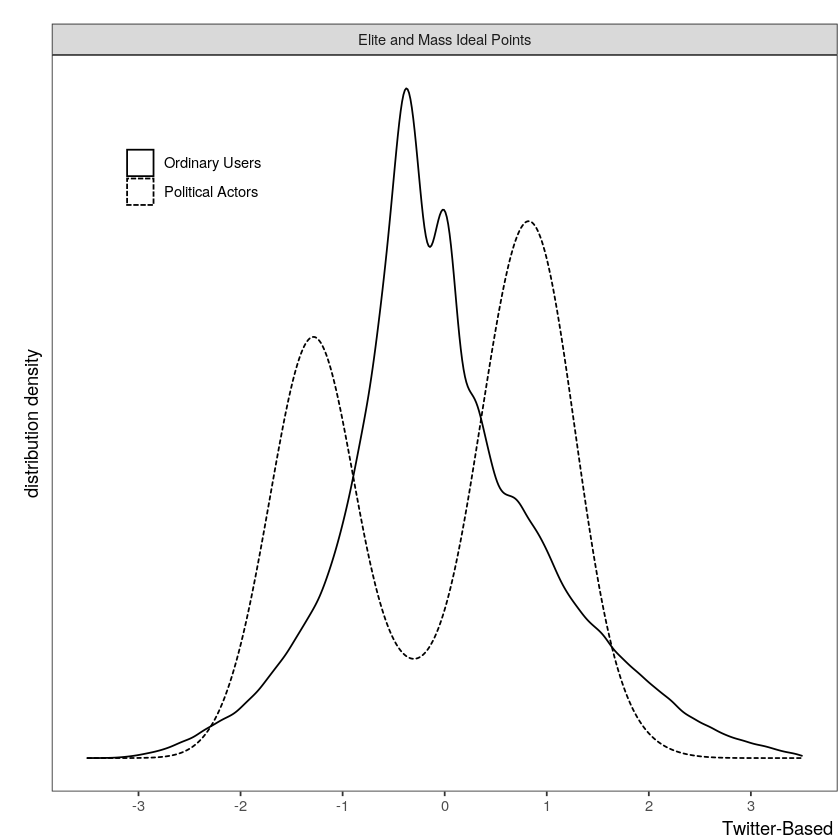

In [143]:
p <- ggplot(df2, aes(x=theta, linetype=type))
pq1 <- p + geom_density() + facet_wrap(~facet, nrow=1) + scale_y_continuous("distribution density") +
        scale_x_continuous("Twitter-Based ", breaks=seq(-3,3,1), limits=c(-3.5, 3.5)) + theme_bw() +
        scale_linetype_discrete("Group") + 
        theme(axis.line.y=element_blank(), axis.ticks.y=element_blank(), axis.text.y=element_blank(),
            #axis.ticks.x=element_blank(), axis.text.x=element_blank(),
            axis.title.x=element_text(hjust=1), # changed theme_text() to element_text()
             plot.margin=unit(c(0.5, 0.05, 0, 0.5), "cm"), panel.grid.major = element_blank(),
            panel.grid.minor = element_blank(), legend.position=c(0.18,.84), legend.title=element_blank())
pq1

In [117]:
ggsave("elite-mass density.png", plot = pq1)

Saving 6.67 x 6.67 in image

Warning message:
“Removed 112 rows containing non-finite values (stat_density).”


Warning message:
“Removed 14 rows containing non-finite values (stat_density).”


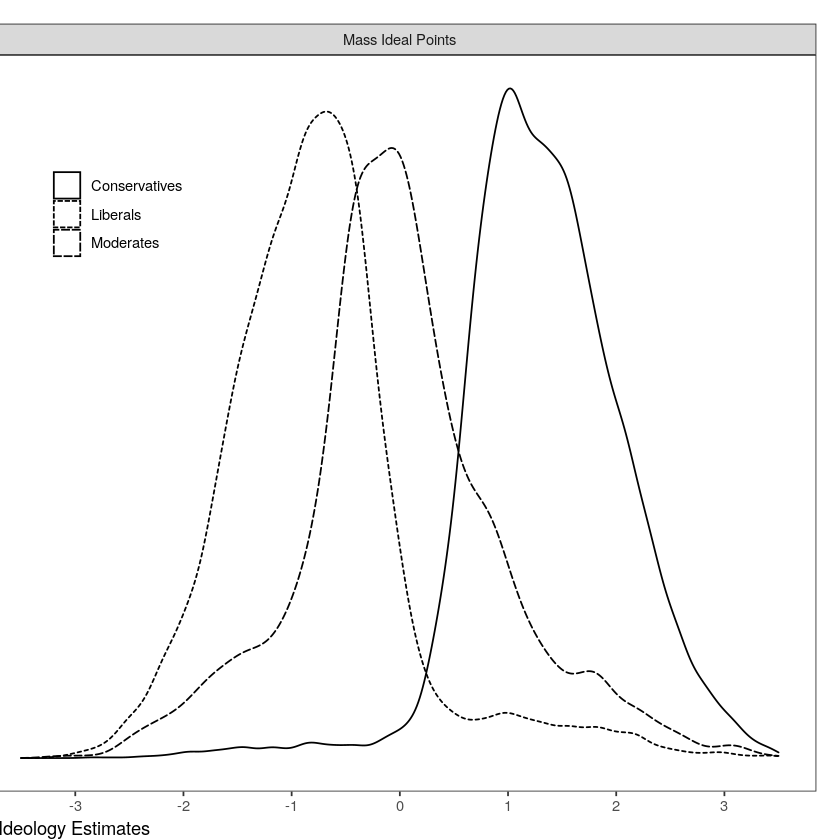

In [146]:
p <- ggplot(df1, aes(x=theta, linetype=type))
pq2 <- p + geom_density() + facet_wrap(~facet, nrow=1) + scale_y_continuous("distribution density") +
        scale_x_continuous("   Ideology Estimates", breaks=seq(-3,3,1), limits=c(-3.5, 3.5)) + theme_bw() +
        scale_linetype_discrete("Group") + 
        theme(axis.line.y=element_blank(), axis.title.y=element_blank(),
            axis.ticks.y=element_blank(), axis.text.y=element_blank(),
            #axis.ticks.x=element_blank(), axis.text.x=element_blank(), 
            axis.title.x=element_text(hjust=0), 
             plot.margin=unit(c(0.5, 0.5, 0, -.45), "cm"), panel.grid.major = element_blank(),
            panel.grid.minor = element_blank(), legend.position=c(0.16,.79), legend.title=element_blank())
pq2

In [119]:
ggsave("ideology density.png", plot = pq2)

Saving 6.67 x 6.67 in image

Warning message:
“Removed 14 rows containing non-finite values (stat_density).”


Warning message:
“Removed 112 rows containing non-finite values (stat_density).”
Warning message:
“Removed 14 rows containing non-finite values (stat_density).”


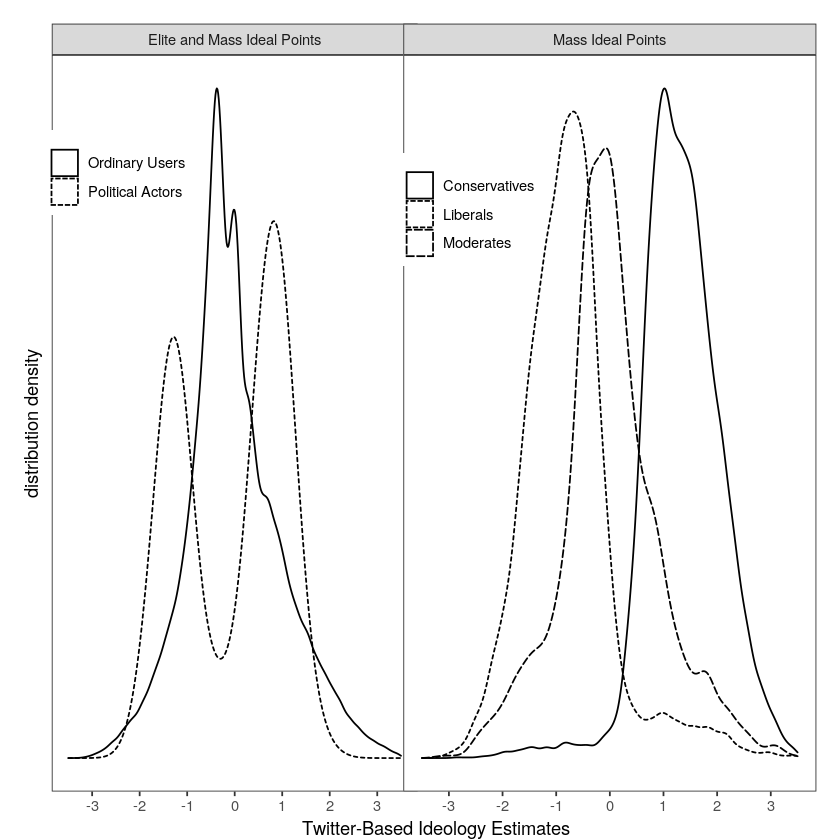

In [147]:
pq3 <- grid.arrange(pq1, pq2, nrow = 1, ncol = 2)
ggsave("density grid.png", plot = pq3, width = 9, height = 4.5)

### Ideology by State and Correlations

In [13]:
# loading public opinion data
load("Barbera/state-data.rdata")

# loading user data
load("Barbera/users-data-US.rdata")

# normalizing estimates
users$theta <- (users$theta - mean(users$theta))/sd(users$theta)

# keeping only users with a state
users <- users[users$state %in% state.name,]

# computing confidence intervals for each state
med <- aggregate(users$theta, by=list(state=users$state), median)
lo <- aggregate(users$theta, by=list(state=users$state), quantile, prob=0.025)
hi <- aggregate(users$theta, by=list(state=users$state), quantile, prob=0.975)

df <- merge(med, lo, by="state")
df <- merge(df, hi, by="state")
names(df)[2:4] <- c("value", "lo", "hi")

# merging with state-level data
state.data <- merge(state.data, df)

## correlations reported in paper
cor(state.data$value, state.data$opinion)
cor(state.data$value, state.data$obama)

[1] -0.8767605

[1] -0.7847936

# Script 08, Section 4.3 Replication

In [15]:
source('Barbera/functions.R')
library(ggplot2)
library(scales)
library(grid)

## loading user estimates and data
load("Barbera/users-data-US.rdata")

## loading Ohio data
load("Barbera/contributor-data.rdata")

## merging
contr <- merge(contr, users)

## category
contr$cat <- "Both parties"
contr$cat[contr$amount_dem>0 & contr$amount_rep==0] <- "Only Democrats"
contr$cat[contr$amount_dem==0 & contr$amount_rep>0] <- "Only Republicans"

In [16]:
table(contr$theta>0)
tab <- table(contr$theta>0, contr$cat)
(tab["TRUE", "Both parties"] + tab["TRUE", "Only Republicans"]) / sum(tab["TRUE",])
(tab["FALSE", "Both parties"] + tab["FALSE", "Only Democrats"]) / sum(tab["FALSE",])
cor(contr$theta, contr$cfscore, use='complete.obs')


FALSE  TRUE 
 1649  1058 

[1] 0.8969754

[1] 0.9818072

[1] 0.7980097

### Figure 5 Data Prep and Plot

In [148]:
## loading user estimates and data
load("Barbera/users-data-US.rdata")

## loading Ohio data
load("Barbera/ohio-data.rdata")

## merging
ohio <- merge(ohio.data, users)

## preparing variables
ohio$party <- "Not registered"
ohio$party[ohio$PARTY_AFFILIATION=="D"] <- "Registered DEM"
ohio$party[ohio$PARTY_AFFILIATION=="R"] <- "Registered REP"

sum.regs <- apply(ohio[,4:42], 1, function(x) sum(x %in% "D") - sum(x %in% "R"))
ohio$sum.regs <- sum.regs

### categorical variable times registered for each party
ohio$regs.cat <- NA
ohio$regs.cat[ohio$sum.regs<(-5)] <- "<-5"
ohio$regs.cat[ohio$sum.regs<=(-3) & ohio$sum.regs>=(-5)] <- "[-3,-5]"
ohio$regs.cat[ohio$sum.regs==(-2)] <- "-2"
ohio$regs.cat[ohio$sum.regs==(-1)] <- "-1"
ohio$regs.cat[ohio$sum.regs==(0)] <- "0"
ohio$regs.cat[ohio$sum.regs==(2)] <- "+2"
ohio$regs.cat[ohio$sum.regs==(1)] <- "+1"
ohio$regs.cat[ohio$sum.regs>(5)] <- ">+5"
ohio$regs.cat[ohio$sum.regs>=(3) & ohio$sum.regs<=(5)] <- "[+3,+5]"
ohio$regs.cat <- factor(ohio$regs.cat, levels=c("<-5", "[-3,-5]", "-2",
    "-1", "0", "+1", "+2", "[+3,+5]", ">+5"))

## combining both datasets before plotting
plotdata <- ohio[,c("uid", "theta", "regs.cat")]
names(plotdata) <- c("uid", "estimates", "x")
plotdata$facet <- "Registration History"

plotdata <- rbind(plotdata, data.frame("uid"=ohio$uid, "estimates"=ohio$theta, x=ohio$party,
    facet="2012"))
plotdata <- plotdata[plotdata$x %in% "Not registered" == FALSE,]
levels(plotdata$x)[c(11,12)] <- c("Dem.", "Rep.")


Warning message:
“Removed 91 rows containing non-finite values (stat_boxplot).”


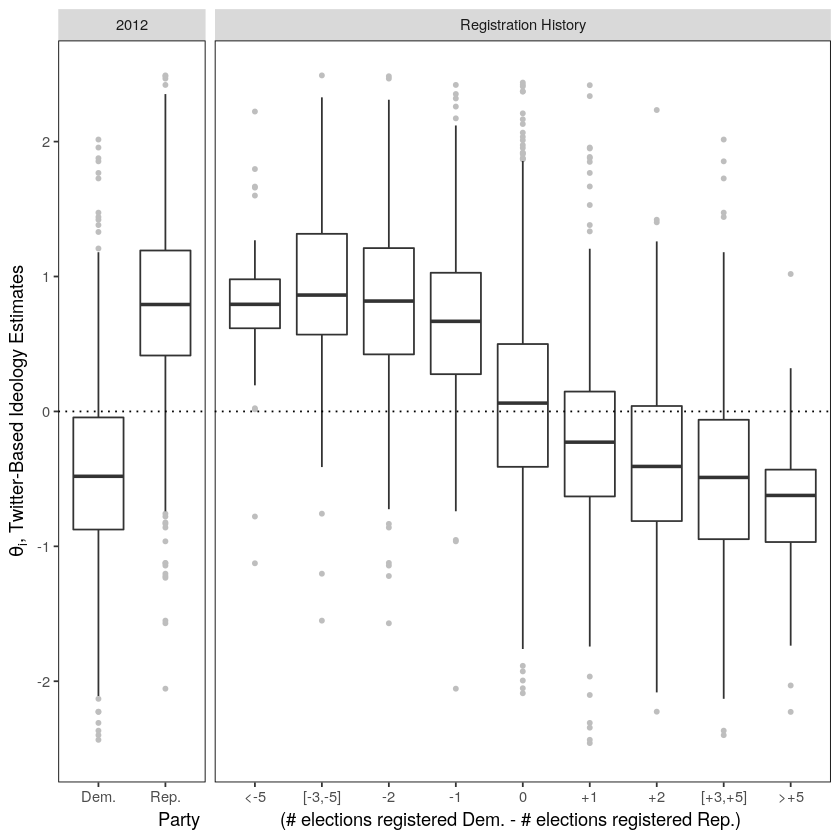

In [149]:
### figure 5

p <- ggplot(plotdata, aes(x=x, y=estimates))
pq <- p + geom_boxplot(outlier.colour="grey", outlier.size=1) +
    scale_x_discrete("  Party                (# elections registered Dem. - # elections registered Rep.)") + 
    scale_y_continuous(expression(paste(theta[i], ", Twitter-Based Ideology Estimates")), limits=c(-2.5, 2.5)) +
        theme(panel.border=element_rect(fill=NA), panel.background = element_blank(), legend.position="none") +
    geom_hline(aes(yintercept=0), linetype=3) +
    facet_grid(~facet,scales="free", space="free")

pq

In [150]:
ggsave("box plot.png", plot = pq)

Saving 6.67 x 6.67 in image

Warning message:
“Removed 91 rows containing non-finite values (stat_boxplot).”


# Script 09, Section 5 Replication

### Figure 6

In [151]:
library(ggplot2)
library(scales)
library(reshape2)

## loading user estimates and data
load("Barbera/users-data-US.rdata")

## loading tweet counts
load("Barbera/tweet-counts.rdata")

## merging
results <- merge(users.tweets, users)

## preparing data for histogram
results$q <- cut(results$theta, breaks=seq(-3, 3, 0.05))
counts1 <- aggregate(results$obama, by=list(q=results$q), FUN=sum)
counts1$keyword <- 'Obama'
counts2 <- aggregate(results$romney, by=list(q=results$q), FUN=sum)
counts2$keyword <- 'Romney'
counts <- rbind(counts1, counts2)
counts$theta <- rep(seq(-(3-0.025), 3, 0.05), 2)

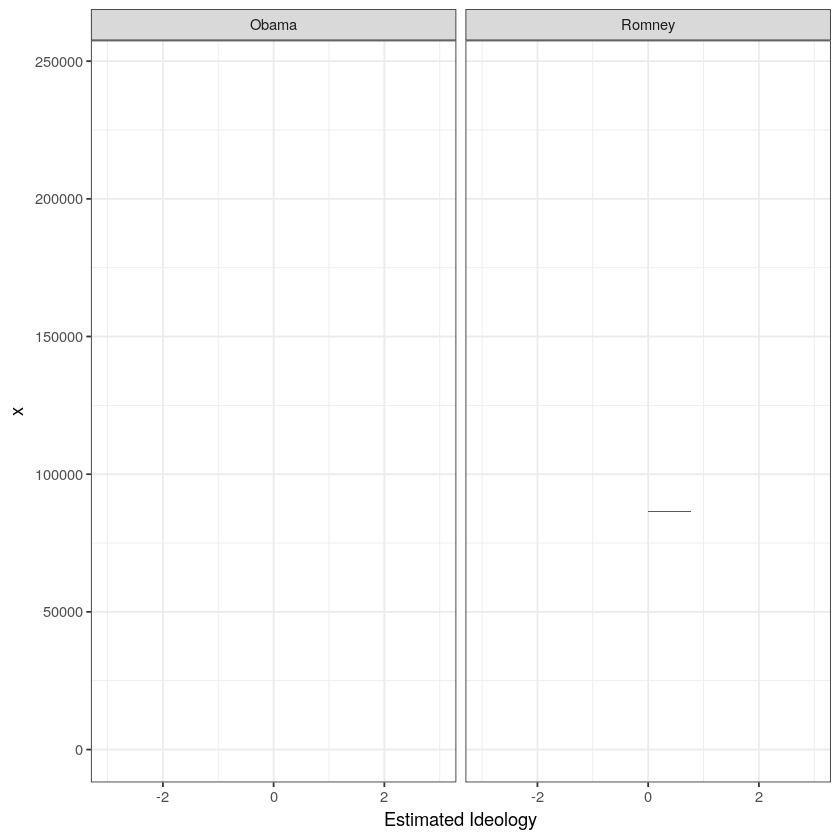

In [157]:
# Visual bug in the notebook is preventing the plot from showing
# replicated in R Studio and the visualization works
p <- ggplot(counts, aes(x=theta, y=x))
pq <- p + geom_bar(stat="identity") + 
		facet_wrap(~keyword,nrow=1) +
		scale_x_continuous("Estimated Ideology", limits=c(-3, 3)) + 
		scale_y_continuous("Count of Sent Tweets",
			breaks=c(0,50000,100000,150000,200000), 
			labels=c("0", "50K", "100K", "150K", "200K"),
			expand=c(0,0)) +
		theme_bw()
pq

In [153]:
ggsave("hist.png", plot = pq)

Saving 6.67 x 6.67 in image



### Figure 7

In [158]:
# loading retweets data
load("Barbera/retweets-data.rdata")

## loading user and elites estimates
load("Barbera/users-data-US.rdata")
load("Barbera/results-elites-US.rdata")
users <- users[,c("uid", "theta")]
results <- results[,c("screen_name", "phi")]
names(results) <- c("uid", "theta")
users <- rbind(users, results)

## merging with ideology estimates
names(users)[1] <- 'retweeter_uid'
retweets <- merge(retweets, users)
names(retweets)[4] <- "phat_y"
names(users)[1] <- 'retweeted_uid'
retweets <- merge(retweets, users)
names(retweets)[5] <- "phat_x"
	
## function to summarize data for heatmap
min <- -3
max <- 3
breaks <- 0.10

expand_data <- function(breaks=0.10, candidate, min=-3, max=3){
	x <- retweets$phat_x[retweets$candidate==candidate]
	y <- retweets$phat_y[retweets$candidate==candidate]	
	x <- (round((x - min) / breaks, 0) * breaks) + min
	y <- (round((y - min) / breaks, 0) * breaks) + min
	tab <- table(x, y)
	tab <- melt(tab)
	tab$prop <- tab$value/sum(tab$value)
	tab$candidate <- candidate
	return(tab)
}

obamaxy <- expand_data(breaks=0.20, candidate="Obama")
romneyxy <- expand_data(breaks=0.20, candidate="Romney")
xy <- rbind(obamaxy, romneyxy)

In [159]:
## quantities reported in paper
sum(xy$prop[xy$x<0 & xy$y<0 & xy$candidate=="Obama"])
sum(xy$prop[xy$x<0 & xy$y<0 & xy$candidate=="Romney"])

sum(xy$prop[xy$x>0 & xy$y>0 & xy$candidate=="Obama"])
sum(xy$prop[xy$x>0 & xy$y>0 & xy$candidate=="Romney"])

tw <- sum(xy$value[xy$y<(-0.5)])
sum(xy$value[xy$y<(-0.5) & xy$x>(-0.5)])/tw

tw <- sum(xy$value[xy$y>(0.5)])
sum(xy$value[xy$y>(0.5) & xy$x<(0.5)])/tw

[1] 0.1925084

[1] 0.4735251

[1] 0.682492

[1] 0.3078365

[1] 0.4530732

[1] 0.1161483

Warning message:
“Removed 1377 rows containing missing values (geom_tile).”


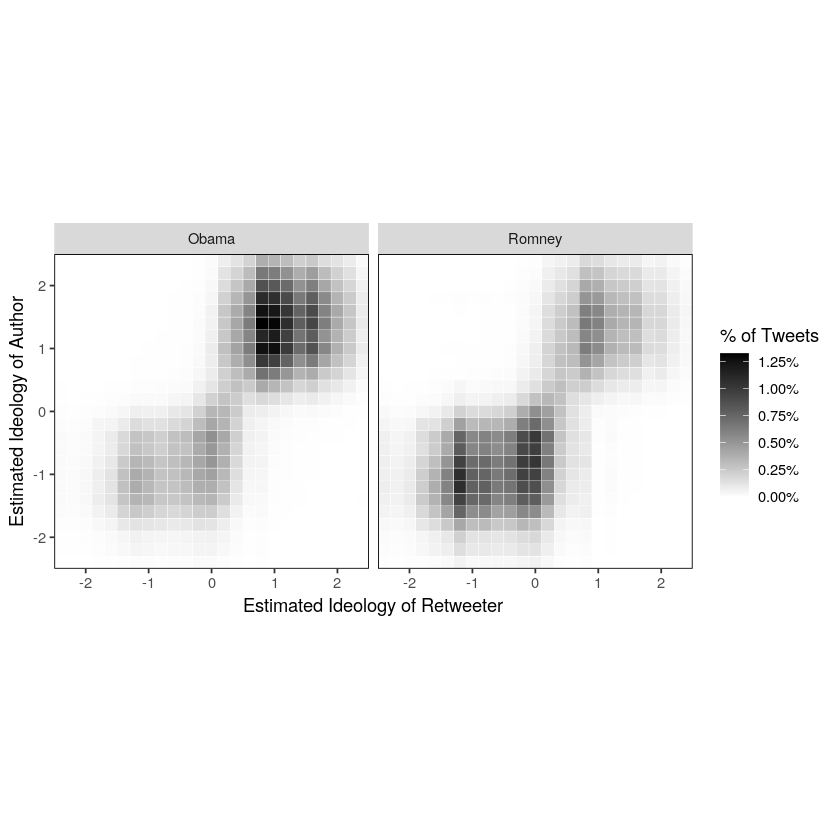

In [160]:
p <- ggplot(xy, aes(x, y))
pq <- p + geom_tile(aes(fill=prop), colour="white") + scale_fill_gradient(name="% of Tweets", 
		low = "white", high = "black", labels=percent_format()) +  
		labs(x="Estimated Ideology of Retweeter", y="Estimated Ideology of Author") + 
		scale_y_continuous(expand=c(0,0), breaks=(-2:2), limits=c(-2.5, 2.5)) +
		scale_x_continuous(expand=c(0,0), breaks=(-2:2), limits=c(-2.5, 2.5)) +
		facet_grid(. ~ candidate) + 
     	theme(panel.border=element_rect(fill=NA), panel.background = element_blank()) +
     	coord_equal()
pq

In [162]:
ggsave("heatmap.png", plot = pq)

Saving 6.67 x 6.67 in image

Warning message:
“Removed 1377 rows containing missing values (geom_tile).”


# Network visualization

In [1]:
library(Matrix)
library(ggplot2)
library(igraph)
library(network)
library(reshape2)
library(dplyr)


Attaching package: ‘igraph’


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union


network: Classes for Relational Data
Version 1.16.0 created on 2019-11-30.
copyright (c) 2005, Carter T. Butts, University of California-Irvine
                    Mark S. Handcock, University of California -- Los Angeles
                    David R. Hunter, Penn State University
                    Martina Morris, University of Washington
                    Skye Bender-deMoll, University of Washington
 For citation information, type citation("network").
 Type help("network-package") to get started.



Attaching package: ‘network’


The following objects are masked from ‘package:igraph’:

    %c%, %s%, add.edges, add.vertices, delete.edges, delete.vertices,
    get.edge.attribute, get.edges, get.vertex.attribute, is.bipartite,
    is.directed, list.edge.attributes, list.vertex.attributes,
    set.edge.attribut

### Retweet Network

To do:
1. get a node list with ideal point estimates. 
    - Get this from the users-data-US
    - Barbera drops users with type = NA. what is type? Isn't confirmed anywhere but it is most likely the self identified political affiliation
2. color by ideal point estimates

In [90]:
# load the retweet data edge list. Candidate is the candidate mentioned in the tweet
load('Barbera/retweets-data.rdata')
load('Barbera/users-data-US.rdata')
dim(retweets)
head(retweets)
dim(users)
head(users)

[1] 6055878       3

,candidate,retweeter_uid,retweeted_uid
,<chr>,<chr>,<chr>
1,Obama,us135442,us118125
2,Obama,us255236,us146998
3,Romney,us177706,us32651
4,Romney,us90287,us32651
5,Obama,us4133,us162932
6,Romney,us228527,us148770


[1] 301537      9

,theta,alpha,state,country,uzip,lat,lon,type,uid
,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>
213795,-1.4800342,-1.475352,Georgia,United States,30303,33.74831,-84.39111,NA,us1
300363,-0.3878467,-1.853607,Maryland,United States,21154,39.66798,-76.37919,NA,us10
245845,0.1688528,-1.684275,Alaska,United States,NA,NA,NA,NA,us100
139520,0.8711387,-2.063020,Texas,United States,75254,32.95398,-96.81689,NA,us1000
184679,0.6074411,-1.337793,Pennsylvania,United States,17033,40.28532,-76.65105,NA,us10000
242790,-1.0361716,-1.485082,North Carolina,United States,28801,35.59846,-82.55314,NA,us100000


In [91]:
# clean retweets
colnames(retweets) <- c('candidate', 'to', 'from')
retweets <- retweets[c('from', 'to')]

In [92]:
# subset users to those with political affiliations
users <- users[users$type!="NA", c("theta", "alpha", "type", "uid")]

In [ ]:
# create a list of unique uid in the retweet df and join to the users df
# drop elements from retweets where both users don't have a type

### Follower Network

To do:
- import elites-data.Rdata and get party variable
- import results-elites-US.rdata and add party variable
- add elite node data to vertices
- standardize sizes of elites

In [109]:
# Load the US adjacency matrix
load('Barbera/adj-matrix-US.rdata')
# Load elites meta data
load('Barbera/elites-data.Rdata')
# Load elites ideal point estimates
load('Barbera/results-elites-US.rdata')

In [110]:
# convert adjacency matrix to edge list
el <- melt(as.matrix(y))
# drop edges with a weight of zero
el <- el[el$value == 1,]
# clean
el <- as.data.frame(el[,c(1,2)])
colnames(el) <- c('from', 'to')
# keep only accounts with a party label
el <- el[el$from %in% users$uid, ]

In [111]:
# retrieve and clean US meta data
us <- as.data.frame(elites.data['US'])
us <- us[,c('US.merge', 'US.party')]
colnames(us) <- c('merge', 'party')

In [112]:
# add merge column to elites results
results$merge <- tolower(results$screen_name)
# left join 
results <- left_join(results, us, on = 'merge')

Joining, by = "merge"



In [24]:
# create a graph object
g <- graph_from_edgelist(as.matrix(el), directed = FALSE)

In [75]:
# assign color based on group
for(i in 1:length(users$uid)){
    uid <- users[i, 'uid']
    type <- users[i, 'type']
    if(type == 'Conservatives'){
        V(g)[uid]$color <- 'red'
    } else if(type == 'Liberals'){
        V(g)[uid]$color <- 'blue'
    } else if(type == 'Moderates'){
        V(g)[uid]$color <- 'purple'
    }
}

In [89]:
head(users)

,theta,type,uid
,<dbl>,<chr>,<chr>
23319,-1.7384068,Liberals,us10001
171074,-1.0349442,Liberals,us100032
259815,1.6713550,Conservatives,us100034
255579,-1.5924539,Liberals,us10004
182091,0.7515268,Conservatives,us100047
234125,0.4761311,Conservatives,us100051


In [25]:
# compute FR layout
followerfr <- layout_with_fr(g, grid = 'nogrid')
save(followerfr, file = "follower_fr_layout.RData")

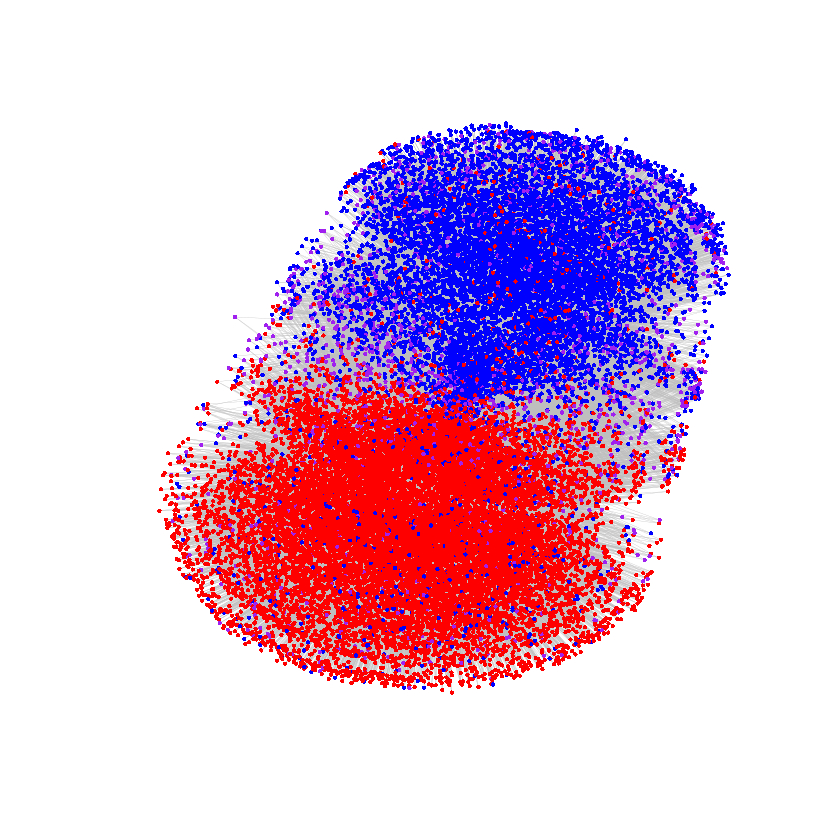

In [86]:
# plot the graph
# set color equal to party
# set size of political leaders to a constant
# png(filename = 'follower_net.png')
plot.igraph(g, 
     layout = followerfr,
     vertex.label = NA,
     vertex.size = 1.5,
     vertex.frame.color = NA,
     edge.color ='gray',
     edge.width = .25
    )
# dev.off()